In [77]:
import json
import math
import os

import cv2
from PIL import Image
import numpy as np
from keras import layers
from keras.applications import DenseNet121
from keras.callbacks import Callback, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
from tqdm import tqdm
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score,KFold
from sklearn.linear_model import LogisticRegression


%matplotlib inline

In [78]:
train_df = pd.read_csv('../Project/Diabetic Retinopathy (resized)/trainLabels.csv')
test_df = pd.read_csv('../Project/Diabetic Retinopathy (resized)/testLabels.csv')
print(train_df.shape)
print(test_df.shape)
test_df.head()

(31142, 2)
(3984, 1)


,image
0,10_left
1,10_right
2,13_left
3,13_right
4,15_left


In [79]:
def get_pad_width(im, new_shape, is_rgb=True):
    pad_diff = new_shape - im.shape[0], new_shape - im.shape[1]
    t, b = math.floor(pad_diff[0]/2), math.ceil(pad_diff[0]/2)
    l, r = math.floor(pad_diff[1]/2), math.ceil(pad_diff[1]/2)
    if is_rgb:
        pad_width = ((t,b), (l,r), (0, 0))
    else:
        pad_width = ((t,b), (l,r))
    return pad_width

def preprocess_image(image_path, desired_size=224):
    im = Image.open(image_path)
    im = im.resize((desired_size, )*2, resample=Image.LANCZOS)
#     im = im.resize((desired_size, )*2)
    
    return im

In [80]:
N = test_df.shape[0]
x_test = np.empty((N, 224, 224, 3), dtype=np.uint8)

for i, image_id in enumerate(tqdm(test_df['image'])):
    x_test[i, :, :, :] = preprocess_image(
        f'../Project/Diabetic Retinopathy (resized)/resized_test/{image_id}.jpeg'
    )

  0%|                                                                                         | 0/3984 [00:00<?, ?it/s]C:\Users\spbay\AppData\Local\Temp\ipykernel_2060\3319797138.py:13: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  im = im.resize((desired_size, )*2, resample=Image.LANCZOS)
100%|██████████████████████████████████████████████████████████████████████████████| 3984/3984 [00:55<00:00, 72.00it/s]


In [81]:
# model.summary()
def load_image_ben_orig(path,resize=True,crop=False,norm255=True,keras=False):
    image = cv2.imread(path)
    
#     if crop:
#         image = crop_image(image)
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#     if resize:
#         image = cv2.resize(image,(SIZE,SIZE))
        
    image=cv2.addWeighted( image,4, cv2.GaussianBlur( image , (0,0) ,  10) ,-4 ,128)
#     image=cv2.addWeighted( image,4, cv2.medianBlur( image , 10) ,-4 ,128)
    
    # NOTE plt.imshow can accept both int (0-255) or float (0-1), but deep net requires (0-1)
    if norm255:
        return image/255
    elif keras:
        #see https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py for mode
        #see https://github.com/keras-team/keras-applications/blob/master/keras_applications/xception.py for inception,xception mode
        #the use of tf based preprocessing (- and / by 127 respectively) will results in [-1,1] so it will not visualize correctly (directly)
        image = np.expand_dims(image, axis=0)
        return preprocess_input(image)[0]
    else:
        return image.astype(np.int16)
    
    return image

def transform_image_ben(img,resize=True,crop=False,norm255=True,keras=False):  
    image=cv2.addWeighted( img,4, cv2.GaussianBlur( img , (0,0) ,  10) ,-4 ,128)
    
    # NOTE plt.imshow can accept both int (0-255) or float (0-1), but deep net requires (0-1)
    if norm255:
        return image/255
    elif keras:
        image = np.expand_dims(image, axis=0)
        return preprocess_input(image)[0]
    else:
        return image.astype(np.int16)
    
    return image

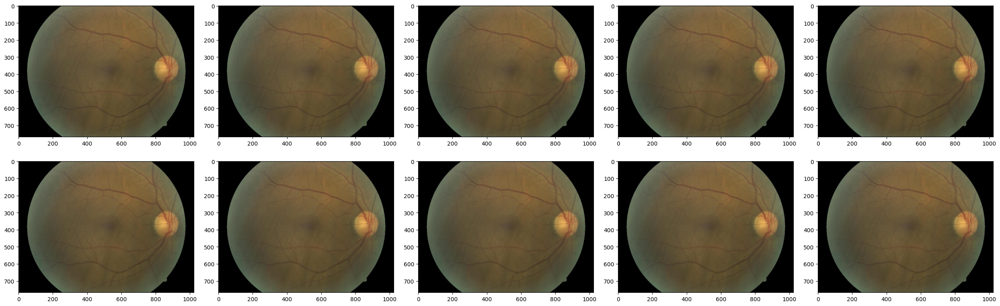

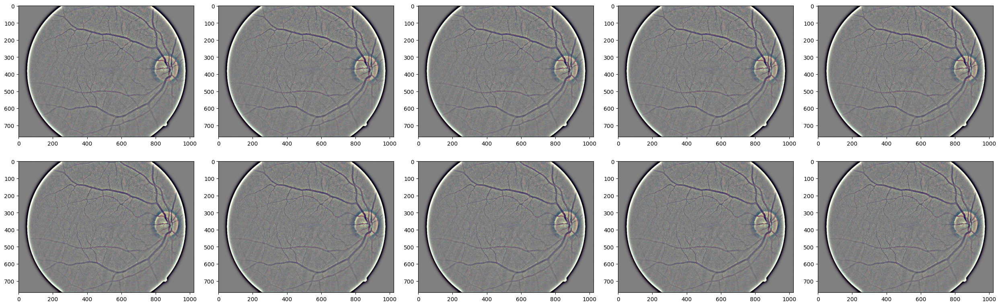

In [82]:
def display_samples(df, columns=5, rows=2, Ben=True):
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'image']
#         image_id = df.loc[i,'diagnosis']
        path = f'../Project/Diabetic Retinopathy (resized)/resized_test/{image_id}.jpeg'
        if Ben:
            img = load_image_ben_orig(path)
        else:
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig.add_subplot(rows, columns, i+1)
#         plt.title(image_id)
        plt.imshow(img)
    
    plt.tight_layout()

display_samples(test_df, Ben=False)
display_samples(test_df, Ben=True)

In [83]:
from keras import layers
from keras.models import Model
import keras.backend as K

In [84]:
K.clear_session()
densenet = DenseNet121(
    weights=None,
    include_top=False,
    input_shape=(None,None,3)
)

In [85]:
GAP_layer = layers.GlobalAveragePooling2D()
drop_layer = layers.Dropout(0.5)
dense_layer = layers.Dense(5, activation='sigmoid', name='final_output')

In [86]:
def build_model_sequential():
    model = Sequential()
    model.add(densenet)
    model.add(GAP_layer)
    model.add(drop_layer)
    model.add(dense_layer)
    return model

In [87]:
modelA = build_model_sequential()
modelA.load_weights('../Project/APTOS Data/dense_xhlulu_731.h5')

modelA.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, None, None, 1024)  7037504   
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 final_output (Dense)        (None, 5)                 5125      
                                                                 
Total params: 7,042,629
Trainable params: 6,958,981
Non-trainable params: 83,648
_________________________________________________________________


In [88]:
def build_model_functional():
    base_model = densenet
    
    x = GAP_layer(base_model.layers[-1].output)
    x = drop_layer(x)
    final_output = dense_layer(x)
    model = Model(base_model.layers[0].input, final_output)
    

    return model

In [89]:
model = build_model_functional() # with pretrained weights, and layers we want
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                                64)                                                           

                                                                                                  
 conv2_block3_concat (Concatena  (None, None, None,   0          ['conv2_block2_concat[0][0]',    
 te)                            160)                              'conv2_block3_2_conv[0][0]']    
                                                                                                  
 conv2_block4_0_bn (BatchNormal  (None, None, None,   640        ['conv2_block3_concat[0][0]']    
 ization)                       160)                                                              
                                                                                                  
 conv2_block4_0_relu (Activatio  (None, None, None,   0          ['conv2_block4_0_bn[0][0]']      
 n)                             160)                                                              
                                                                                                  
 conv2_blo

 n)                             128)                                                              
                                                                                                  
 conv3_block1_1_conv (Conv2D)   (None, None, None,   16384       ['conv3_block1_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block1_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block1_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block1_1_relu (Activatio  (None, None, None,   0          ['conv3_block1_1_bn[0][0]']      
 n)                             128)                                                              
          

 conv3_block5_0_relu (Activatio  (None, None, None,   0          ['conv3_block5_0_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv3_block5_1_conv (Conv2D)   (None, None, None,   32768       ['conv3_block5_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block5_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block5_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block5_1_relu (Activatio  (None, None, None,   0          ['conv3_block5_1_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block9_0_relu (Activatio  (None, None, None,   0          ['conv3_block9_0_bn[0][0]']      
 n)                             384)                                                              
                                                                                                  
 conv3_block9_1_conv (Conv2D)   (None, None, None,   49152       ['conv3_block9_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block9_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block9_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_blo

                                512)                                                              
                                                                                                  
 pool3_relu (Activation)        (None, None, None,   0           ['pool3_bn[0][0]']               
                                512)                                                              
                                                                                                  
 pool3_conv (Conv2D)            (None, None, None,   131072      ['pool3_relu[0][0]']             
                                256)                                                              
                                                                                                  
 pool3_pool (AveragePooling2D)  (None, None, None,   0           ['pool3_conv[0][0]']             
                                256)                                                              
          

 conv4_block4_1_bn (BatchNormal  (None, None, None,   512        ['conv4_block4_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv4_block4_1_relu (Activatio  (None, None, None,   0          ['conv4_block4_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv4_block4_2_conv (Conv2D)   (None, None, None,   36864       ['conv4_block4_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv4_block4_concat (Concatena  (None, None, None,   0          ['conv4_block3_concat[0][0]',    
 te)      

                                                                                                  
 conv4_block8_1_bn (BatchNormal  (None, None, None,   512        ['conv4_block8_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv4_block8_1_relu (Activatio  (None, None, None,   0          ['conv4_block8_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv4_block8_2_conv (Conv2D)   (None, None, None,   36864       ['conv4_block8_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv4_blo

                                128)                                                              
                                                                                                  
 conv4_block12_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block12_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block12_1_relu (Activati  (None, None, None,   0          ['conv4_block12_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_block12_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block12_1_relu[0][0]']   
                                32)                                                               
          

 conv4_block16_1_conv (Conv2D)  (None, None, None,   94208       ['conv4_block16_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block16_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block16_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block16_1_relu (Activati  (None, None, None,   0          ['conv4_block16_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_block16_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block16_1_relu[0][0]']   
          

                                                                                                  
 conv4_block20_1_conv (Conv2D)  (None, None, None,   110592      ['conv4_block20_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block20_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block20_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block20_1_relu (Activati  (None, None, None,   0          ['conv4_block20_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_blo

 on)                            992)                                                              
                                                                                                  
 conv4_block24_1_conv (Conv2D)  (None, None, None,   126976      ['conv4_block24_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block24_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block24_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block24_1_relu (Activati  (None, None, None,   0          ['conv4_block24_1_bn[0][0]']     
 on)                            128)                                                              
          

 conv5_block3_1_relu (Activatio  (None, None, None,   0          ['conv5_block3_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv5_block3_2_conv (Conv2D)   (None, None, None,   36864       ['conv5_block3_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv5_block3_concat (Concatena  (None, None, None,   0          ['conv5_block2_concat[0][0]',    
 te)                            608)                              'conv5_block3_2_conv[0][0]']    
                                                                                                  
 conv5_block4_0_bn (BatchNormal  (None, None, None,   2432       ['conv5_block3_concat[0][0]']    
 ization) 

                                                                                                  
 conv5_block7_1_relu (Activatio  (None, None, None,   0          ['conv5_block7_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv5_block7_2_conv (Conv2D)   (None, None, None,   36864       ['conv5_block7_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv5_block7_concat (Concatena  (None, None, None,   0          ['conv5_block6_concat[0][0]',    
 te)                            736)                              'conv5_block7_2_conv[0][0]']    
                                                                                                  
 conv5_blo

 lization)                      128)                                                              
                                                                                                  
 conv5_block11_1_relu (Activati  (None, None, None,   0          ['conv5_block11_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv5_block11_2_conv (Conv2D)  (None, None, None,   36864       ['conv5_block11_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv5_block11_concat (Concaten  (None, None, None,   0          ['conv5_block10_concat[0][0]',   
 ate)                           864)                              'conv5_block11_2_conv[0][0]']   
          

 conv5_block15_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block15_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv5_block15_1_relu (Activati  (None, None, None,   0          ['conv5_block15_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv5_block15_2_conv (Conv2D)  (None, None, None,   36864       ['conv5_block15_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv5_block15_concat (Concaten  (None, None, None,   0          ['conv5_block14_concat[0][0]',   
 ate)     

In [90]:
y_test = model.predict(x_test) > 0.5
y_test = y_test.astype(int).sum(axis=1) - 1

test_df['diagnosis'] = y_test
test_df.to_csv('submission.csv',index=False)
y_test.shape, x_test.shape

C:\Users\spbay\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


((3984,), (3984, 224, 224, 3))

In [91]:
import seaborn as sns
import cv2

SIZE=224
def create_pred_hist(pred_level_y,title='NoTitle'):
    results = pd.DataFrame({'diagnosis':pred_level_y})

    f, ax = plt.subplots(figsize=(7, 4))
    ax = sns.countplot(x="diagnosis", data=results, palette="GnBu_d")
    sns.despine()
    plt.title(title)
    plt.show()

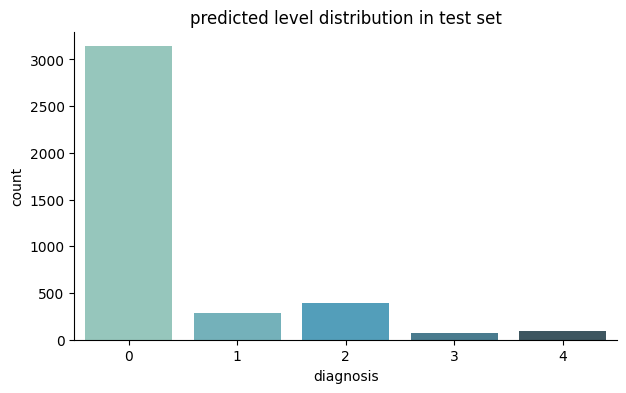

In [92]:
create_pred_hist(y_test,title='predicted level distribution in test set')

In [93]:
iris=load_iris()
X=iris.data            #K Fold cross validation
Y=iris.target
logreg=LogisticRegression()
kf=KFold(n_splits=10)
score=cross_val_score(logreg,X,Y,cv=kf)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))

Cross Validation Scores are [1.         1.         1.         1.         0.93333333 0.86666667
 1.         0.86666667 0.86666667 0.93333333]
Average Cross Validation score :0.9466666666666667


C:\Users\spbay\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\spbay\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

In [94]:
y_actu = y_test
y_pred = y_test
df_confusion = confusion_matrix(y_actu, y_pred)

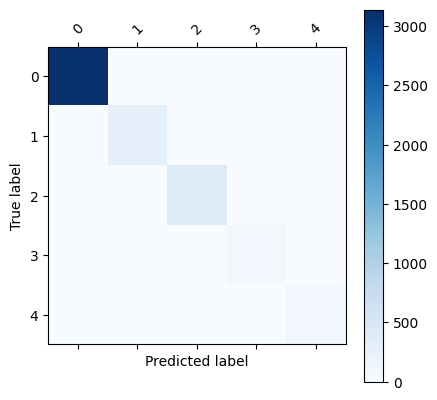

In [95]:
import matplotlib.pyplot as plt
def plot_confusion_matrix(df_confusion, classes = ['0','1','2','3','4'],title=None, normalize=False,cmap=plt.cm.Blues):
    plt.matshow(df_confusion, cmap=cmap) # imshow
    #plt.title(title)
    plt.colorbar()
    plt.title(title)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

plot_confusion_matrix(df_confusion)

In [96]:
def gen_heatmap_img(img, model0, layer_name='last_conv_layer',viz_img=None,orig_img=None):
    preds_raw = model0.predict(img[np.newaxis])
    preds = preds_raw > 0.5 # use the same threshold as @xhlulu original kernel
    class_idx = (preds.astype(int).sum(axis=1) - 1)[0]
#     print(class_idx, class_idx.shape)
    class_output_tensor = model0.output[:, class_idx]
    
    viz_layer = model0.get_layer(layer_name)
    grads = K.gradients(
                        class_output_tensor ,
                        viz_layer.output
                        )[0] # gradients of viz_layer wrt output_tensor of predicted class
    
    pooled_grads=K.mean(grads,axis=(0,1,2))
    iterate=K.function([model0.input],[pooled_grads, viz_layer.output[0]])
    
    pooled_grad_value, viz_layer_out_value = iterate([img[np.newaxis]])
    
    for i in range(pooled_grad_value.shape[0]):
        viz_layer_out_value[:,:,i] *= pooled_grad_value[i]
    
    heatmap = np.mean(viz_layer_out_value, axis=-1)
    heatmap = np.maximum(heatmap,0)
    heatmap /= np.max(heatmap)

    viz_img=cv2.resize(viz_img,(img.shape[1],img.shape[0]))
    heatmap=cv2.resize(heatmap,(viz_img.shape[1],viz_img.shape[0]))
    
    heatmap_color = cv2.applyColorMap(np.uint8(heatmap*255), cv2.COLORMAP_SPRING)/255
    heated_img = heatmap_color*0.5 + viz_img*0.5
    
    print('raw output from model : ')
    print_pred(preds_raw)
    
    if orig_img is None:
        show_Nimages([img,viz_img,heatmap_color,heated_img])
    else:
        show_Nimages([orig_img,img,viz_img,heatmap_color,heated_img])
    
    plt.show()
    return heated_img

In [97]:
def show_image(image,figsize=None,title=None):
    
    if figsize is not None:
        fig = plt.figure(figsize=figsize)
#     else: # crash!!
#         fig = plt.figure()
        
    if image.ndim == 2:
        plt.imshow(image,cmap='gray')
    else:
        plt.imshow(image)
        
    if title is not None:
        plt.title(title)

def show_Nimages(imgs,scale=1):

    N=len(imgs)
    fig = plt.figure(figsize=(25/scale, 16/scale))
    for i, img in enumerate(imgs):
        ax = fig.add_subplot(1, N, i + 1, xticks=[], yticks=[])
        show_image(img)
        
def print_pred(array_of_classes):
    xx = array_of_classes
    s1,s2 = xx.shape
    for i in range(s1):
        for j in range(s2):
            print('%.3f ' % xx[i,j],end='')
        print('')

C:\Users\spbay\AppData\Local\Temp\ipykernel_2060\3319797138.py:13: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  im = im.resize((desired_size, )*2, resample=Image.LANCZOS)


test pic no.1
raw output from model : 
0.999 0.041 0.013 0.001 0.002 


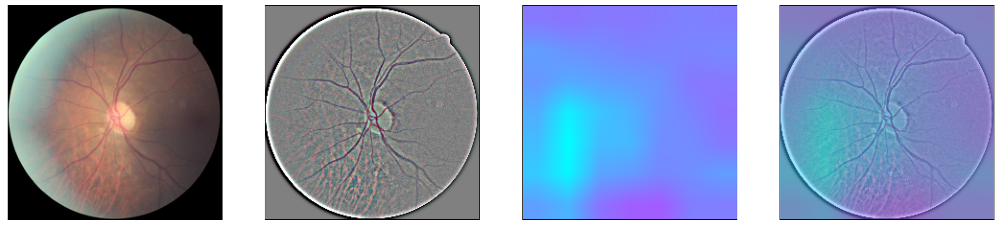

test pic no.2
raw output from model : 
0.998 0.767 0.721 0.017 0.135 


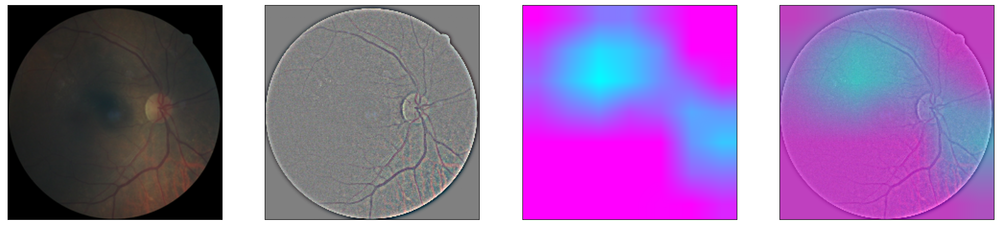

test pic no.3
raw output from model : 
0.999 0.001 0.000 0.001 0.001 


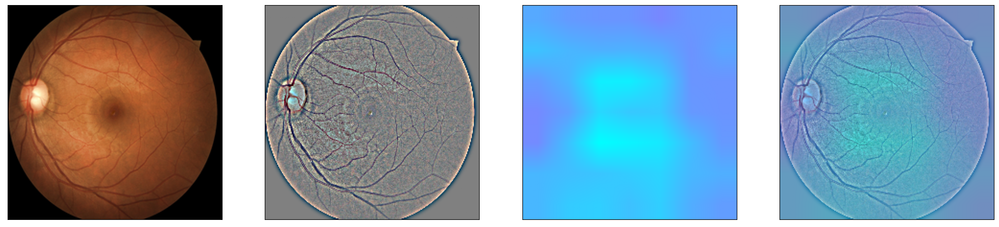

test pic no.4
raw output from model : 
0.998 0.007 0.000 0.002 0.002 


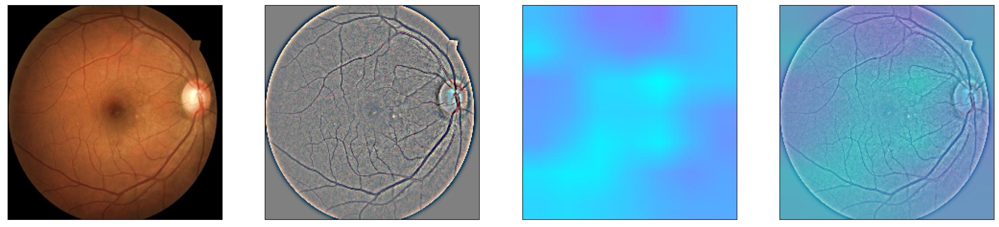

test pic no.5
raw output from model : 
0.997 0.010 0.020 0.007 0.013 


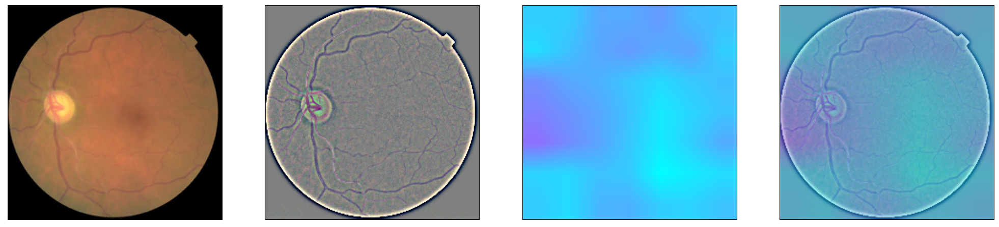

test pic no.6
raw output from model : 
0.997 0.123 0.036 0.023 0.031 


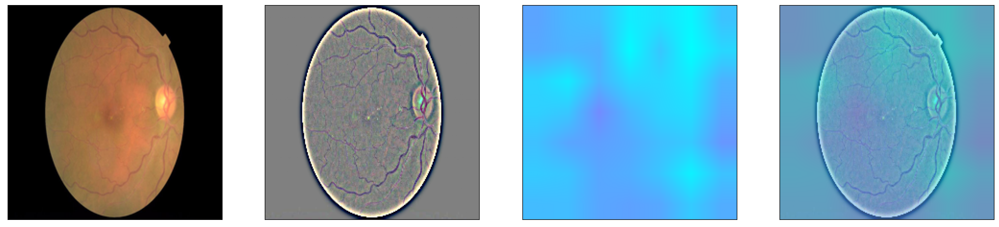

test pic no.7
raw output from model : 
0.997 0.997 0.998 0.913 0.554 


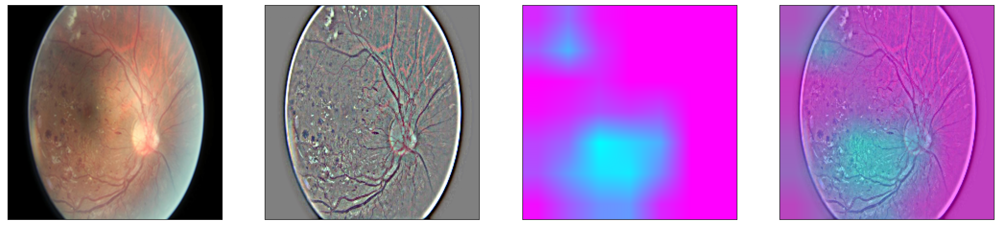

test pic no.8
raw output from model : 
0.999 1.000 1.000 0.998 0.964 


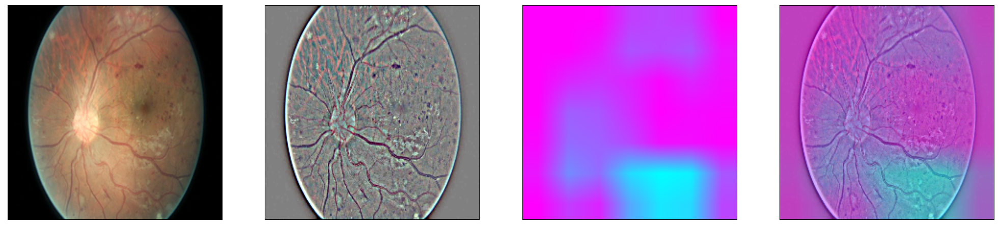

test pic no.9
raw output from model : 
0.998 0.001 0.000 0.001 0.001 


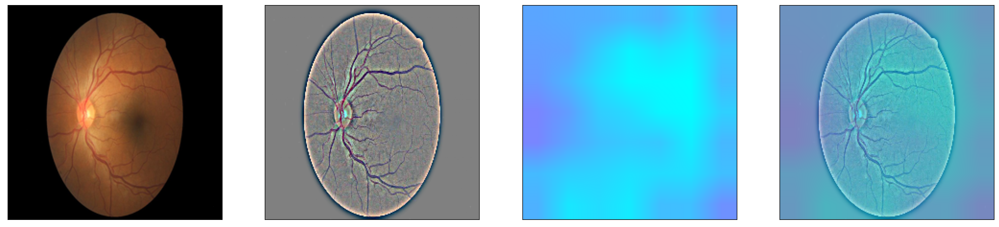

test pic no.10
raw output from model : 
0.998 0.029 0.008 0.003 0.003 


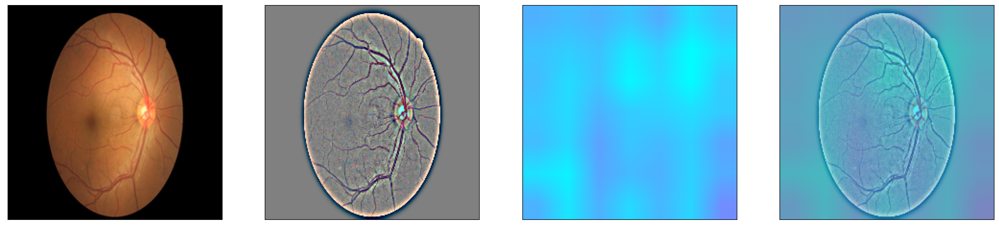

In [98]:
NUM_SAMP=10
SEED=77
layer_name = 'relu' #'conv5_block16_concat'
for i, (idx, row) in enumerate(test_df[:NUM_SAMP].iterrows()):
    path=f"../Project/Diabetic Retinopathy (resized)/resized_test//{row['image']}.jpeg"
    ben_img = load_image_ben_orig(path)
    input_img = np.empty((1,224, 224, 3), dtype=np.uint8)
    input_img[0,:,:,:] = preprocess_image(path)
        
    print('test pic no.%d' % (i+1))
    _ = gen_heatmap_img(input_img[0],
                        model, layer_name=layer_name,viz_img=ben_img)

161 202
Rotate or Flip
Brightness or Contrast
Rotate and Resize
(224, 224, 3) (224, 224, 3)
CutOut
Sun Flare


C:\Users\spbay\AppData\Roaming\Python\Python310\site-packages\albumentations\augmentations\dropout\cutout.py:50: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


All above combined
(224, 224, 3) (224, 224, 3)


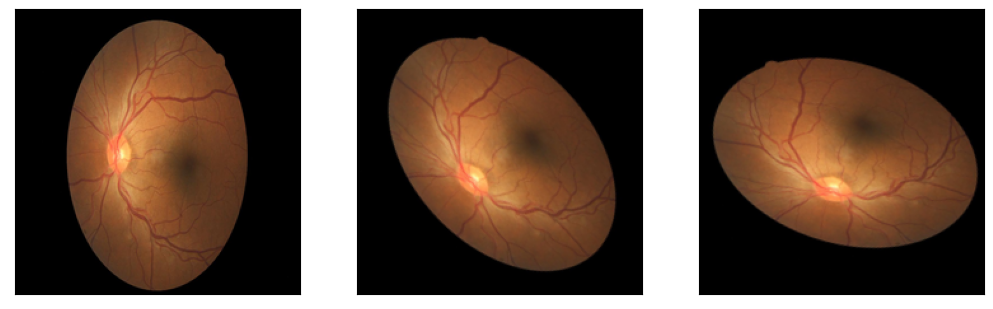

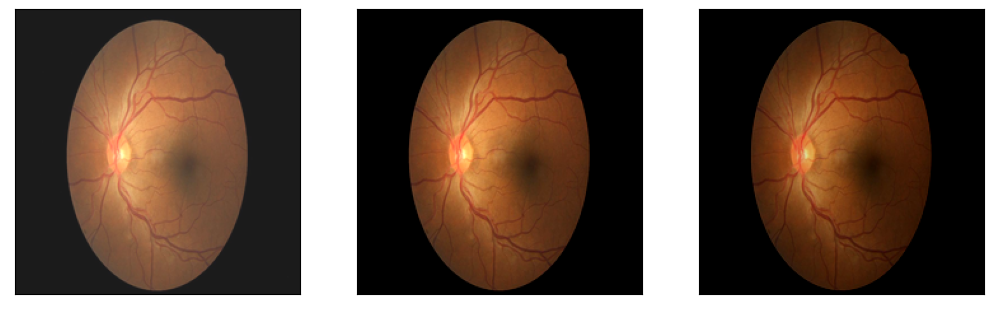

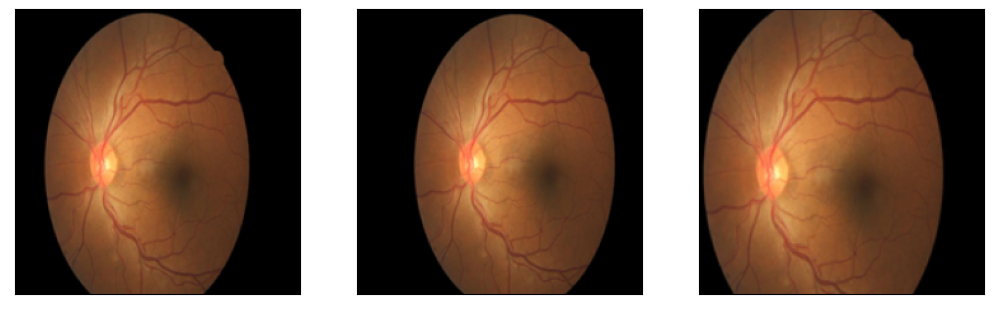

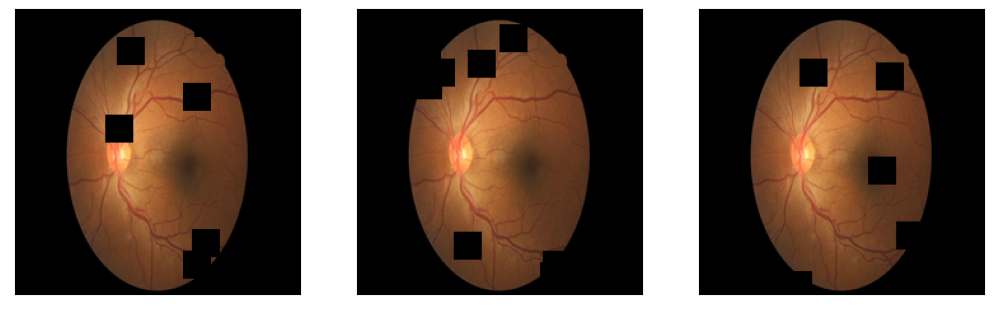

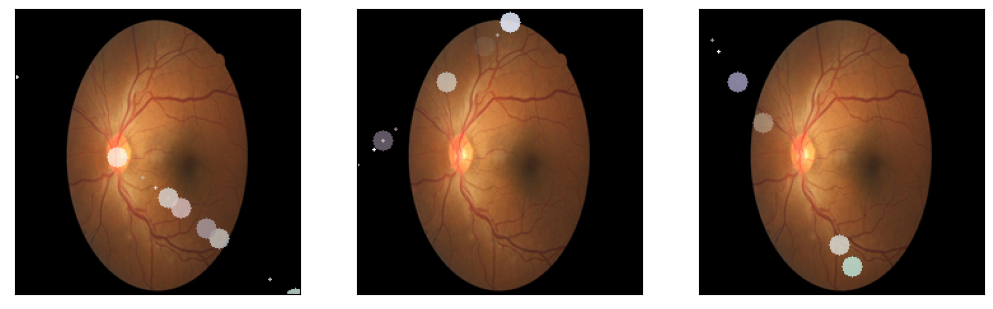

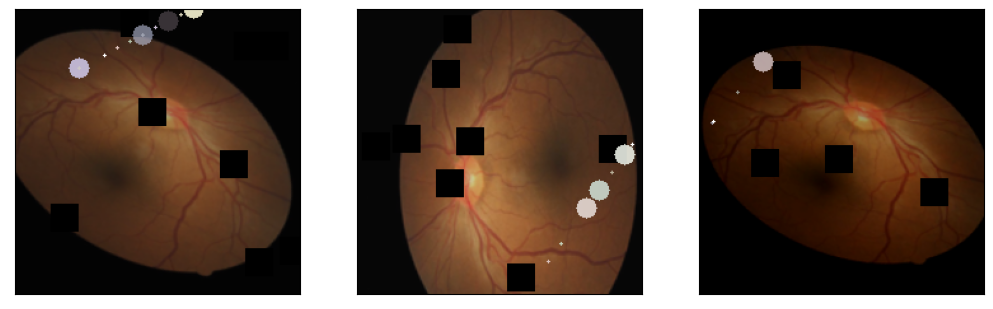

In [99]:
from albumentations import *
import time

IMG_SIZE = (224,224)

'''Use case from https://www.kaggle.com/alexanderliao/image-augmentation-demo-with-albumentation/'''
def albaugment(aug0, img):
    return aug0(image=img)['image']
idx=8
image1=x_test[idx]

'''1. Rotate or Flip'''
aug1 = OneOf([
    Rotate(p=0.99, limit=160, border_mode=0,value=0), # value=black
    Flip(p=0.5)
    ],p=1)

'''2. Adjust Brightness or Contrast'''
aug2 = RandomBrightnessContrast(brightness_limit=0.45, contrast_limit=0.45,p=1)
h_min=np.round(IMG_SIZE[1]*0.72).astype(int)
h_max= np.round(IMG_SIZE[1]*0.9).astype(int)
print(h_min,h_max)

'''3. Random Crop and then Resize'''
#w2h_ratio = aspect ratio of cropping
aug3 = RandomSizedCrop((h_min, h_max),IMG_SIZE[1],IMG_SIZE[0], w2h_ratio=IMG_SIZE[0]/IMG_SIZE[1],p=1)

'''4. CutOut Augmentation'''
max_hole_size = int(IMG_SIZE[1]/10)
aug4 = Cutout(p=1,max_h_size=max_hole_size,max_w_size=max_hole_size,num_holes=8 )#default num_holes=8

'''5. SunFlare Augmentation'''
aug5 = RandomSunFlare(src_radius=max_hole_size,
                      num_flare_circles_lower=10,
                      num_flare_circles_upper=20,
                      p=1)#default flare_roi=(0,0,1,0.5),

'''6. Ultimate Augmentation -- combine everything'''
final_aug = Compose([
    aug1,aug2,aug3,aug4,aug5
],p=1)


img1 = albaugment(aug1,image1)
img2 = albaugment(aug1,image1)
print('Rotate or Flip')
show_Nimages([image1,img1,img2],scale=2)
# time.sleep(1)

img1 = albaugment(aug2,image1)
img2 = albaugment(aug2,image1)
img3 = albaugment(aug2,image1)
print('Brightness or Contrast')
show_Nimages([img3,img1,img2],scale=2)
# time.sleep(1)

img1 = albaugment(aug3,image1)
img2 = albaugment(aug3,image1)
img3 = albaugment(aug3,image1)
print('Rotate and Resize')
show_Nimages([img3,img1,img2],scale=2)
print(img1.shape,img2.shape)
# time.sleep(1)

img1 = albaugment(aug4,image1)
img2 = albaugment(aug4,image1)
img3 = albaugment(aug4,image1)
print('CutOut')
show_Nimages([img3,img1,img2],scale=2)
# time.sleep(1)

img1 = albaugment(aug5,image1)
img2 = albaugment(aug5,image1)
img3 = albaugment(aug5,image1)
print('Sun Flare')
show_Nimages([img3,img1,img2],scale=2)
# time.sleep(1)

img1 = albaugment(final_aug,image1)
img2 = albaugment(final_aug,image1)
img3 = albaugment(final_aug,image1)
print('All above combined')
show_Nimages([img3,img1,img2],scale=2)
print(img1.shape,img2.shape)

C:\Users\spbay\AppData\Local\Temp\ipykernel_2060\3319797138.py:13: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  im = im.resize((desired_size, )*2, resample=Image.LANCZOS)


test pic no.1 -- augmentation: SunFlare
raw output from model : 
0.997 0.134 0.011 0.003 0.001 


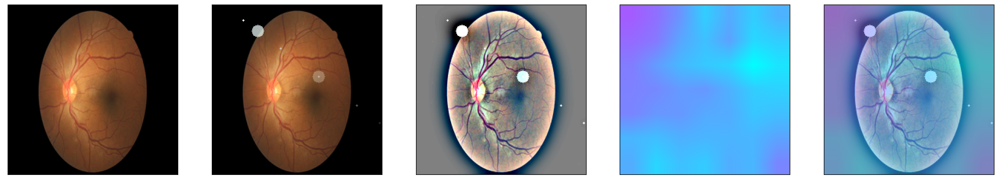

test pic no.2 -- augmentation: brightness or contrast
raw output from model : 
0.999 0.006 0.001 0.003 0.001 


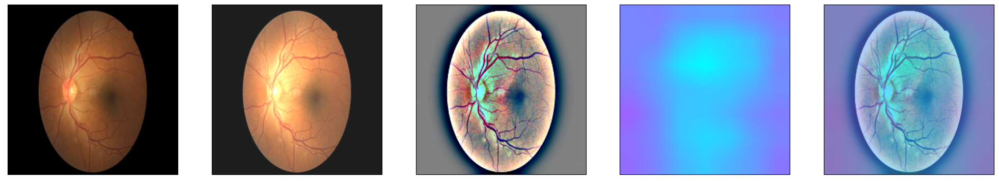

test pic no.3 -- augmentation: crop and resized
raw output from model : 
0.998 0.212 0.062 0.011 0.006 


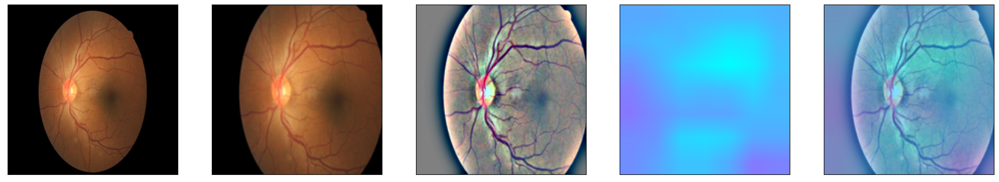

test pic no.4 -- augmentation: CutOut
raw output from model : 
0.999 0.063 0.007 0.007 0.012 


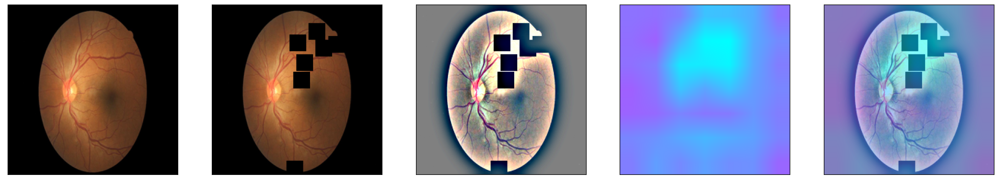

test pic no.5 -- augmentation: rotate or flip
raw output from model : 
0.999 0.006 0.002 0.002 0.001 


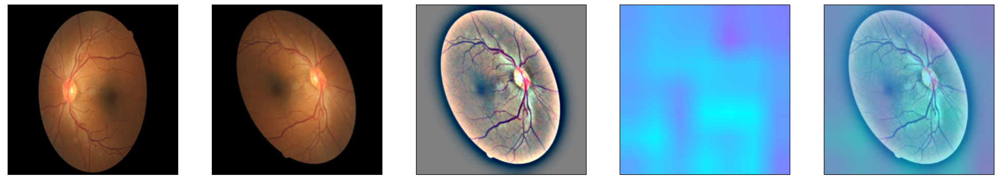

test pic no.6 -- augmentation: Everything Combined
raw output from model : 
0.999 0.621 0.169 0.357 0.140 


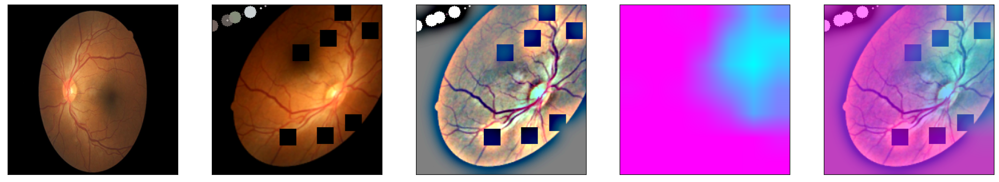

In [100]:
aug_list = [aug5, aug2, aug3, aug4, aug1, final_aug]
aug_name = ['SunFlare', 'brightness or contrast', 'crop and resized', 'CutOut', 'rotate or flip', 'Everything Combined']

idx=8
layer_name = 'relu' #'conv5_block16_concat'
for i in range(len(aug_list)):
    path=f"../Project/Diabetic Retinopathy (resized)/resized_test//{test_df.iloc[idx]['image']}.jpeg"
    input_img = np.empty((1,224, 224, 3), dtype=np.uint8)
    input_img[0,:,:,:] = preprocess_image(path)
    aug_img = albaugment(aug_list[i],input_img[0,:,:,:])
    ben_img = transform_image_ben(aug_img)
    
    print('test pic no.%d -- augmentation: %s' % (i+1, aug_name[i]))
    _ = gen_heatmap_img(aug_img,
                        model, layer_name=layer_name,viz_img=ben_img,orig_img=input_img[0])